In [71]:
import torch
import torch.nn as nn
from torchvision import transforms
from torchvision.datasets import FashionMNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# torch.manual_seed(0)

In [72]:

class Generator(nn.Module):
  def __init__(self, noise_dim=10, real_dim=784, hidden_dim=128):
    super(Generator, self).__init__()
    layers = [
        self.gen_block(noise_dim, hidden_dim),
        self.gen_block(hidden_dim, 2*hidden_dim),
        self.gen_block(2*hidden_dim, 4*hidden_dim),
        self.gen_block(4*hidden_dim, 8*hidden_dim),
        nn.Linear(8*hidden_dim, real_dim),
        nn.Sigmoid()
    ]
    self.generator = nn.Sequential(*layers)

  def forward(self, noise):
    return self.generator(noise)

  def gen_block(self, in_dim, out_dim):
    return nn.Sequential(
        nn.Linear(in_dim, out_dim),
        nn.BatchNorm1d(out_dim),
        nn.ReLU(inplace=True)
    )

In [73]:
class Discriminator(nn.Module):
  def __init__(self, real_dim=784, hidden_dim=128):
    super().__init__()
    layers=[
        self.disc_block(real_dim, hidden_dim*2),
        self.disc_block(2*hidden_dim, 4*hidden_dim),
        self.disc_block(4*hidden_dim, 3*hidden_dim),
        self.disc_block(3*hidden_dim, hidden_dim),
        nn.Linear(hidden_dim, 1)
    ]
    self.discriminator = nn.Sequential(*layers)

  def forward(self, data):
    return self.discriminator(data)

  def disc_block(self, in_dim, out_dim):
    return nn.Sequential(
        nn.Linear(in_dim, out_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )

In [74]:
def create_noise(n_samples, noise_dim, device):
  return torch.randn(n_samples, noise_dim).to(device)
# create_noise(10, 3)

In [75]:
criterion = nn.BCEWithLogitsLoss()
epochs=200
noise_dim = 64
disp = 500
batch_size = 128
lr = 1E-5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [70]:
from torchvision import transforms
transform = transforms.Compose([
    transforms.ToTensor(),
])
dataloader = DataLoader(
    FashionMNIST(".", download=True, transform=transform),
    batch_size = batch_size,
    shuffle=True
)

100%|██████████| 26421880/26421880 [00:02<00:00, 11860318.94it/s]


Extracting ./FashionMNIST/raw/train-images-idx3-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 203360.82it/s]


Extracting ./FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 3729418.50it/s]


Extracting ./FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 18614031.89it/s]

Extracting ./FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./FashionMNIST/raw



In [76]:
generator = Generator(noise_dim).to(device)
discriminator = Discriminator().to(device)
gen_opt = torch.optim.Adam(generator.parameters(), lr=lr)
disc_opt = torch.optim.Adam(discriminator.parameters(), lr=lr)

In [77]:
def disc_loss(discriminator, generator, criterion, real, num_images, z_dim, device):
    fake_noise = create_noise(num_images, z_dim, device=device)
    fake = generator(fake_noise)
    disc_fake_pred = discriminator(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = discriminator(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

In [78]:
def gen_loss(discriminator, generator, criterion, num_images, noise_dim, device):
    fake_noise = create_noise(num_images, noise_dim, device=device)
    fake = generator(fake_noise)
    disc_fake_pred = discriminator(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    return gen_loss

In [79]:
def show_images(img_tensor, num_images=25, size=(1, 28, 28)):
  img_unflat = img_tensor.detach().cpu().view(-1, *size)
  img_grid = make_grid(img_unflat[:num_images], nrow=5)
  plt.imshow(img_grid.permute(1, 2, 0).squeeze())
  plt.show()

  6%|▌         | 29/469 [00:00<00:11, 36.97it/s]

Step 500 -> GEN Loss : 1.0899696816205977, DISC Loss : 0.5007590752243994


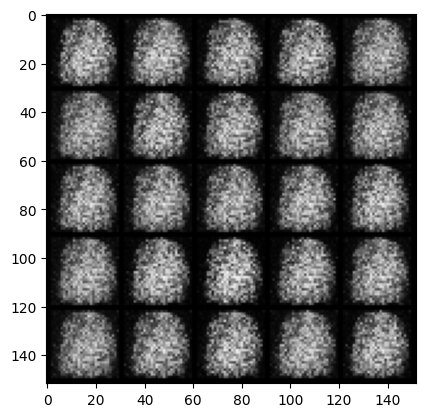

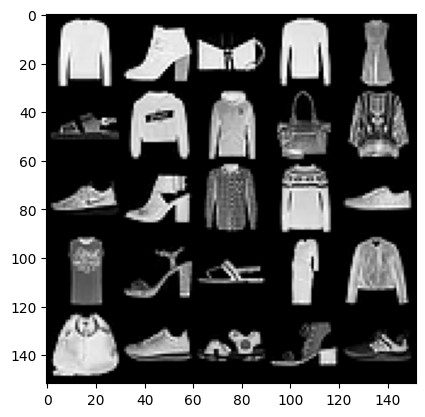

 13%|█▎        | 60/469 [00:01<00:12, 33.97it/s]

Step 1000 -> GEN Loss : 1.6163062663078303, DISC Loss : 0.7993726917505269


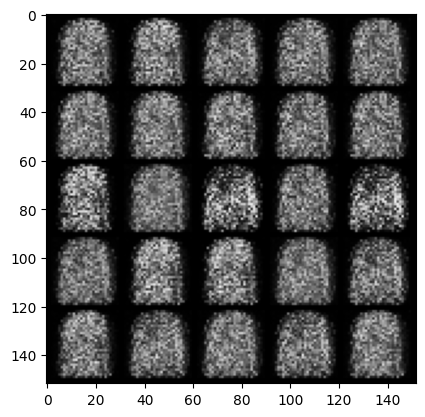

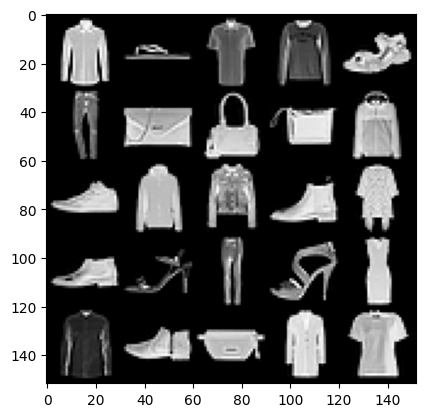

 19%|█▉        | 91/469 [00:02<00:10, 35.57it/s]

Step 1500 -> GEN Loss : 1.4191439568996445, DISC Loss : 1.1982130755782143


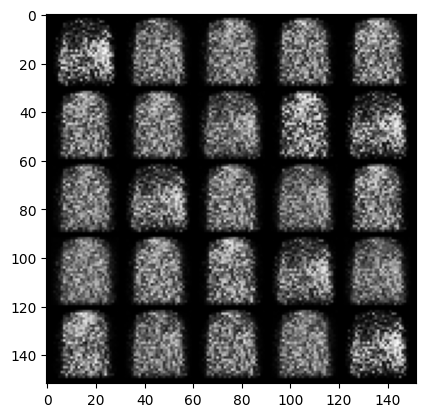

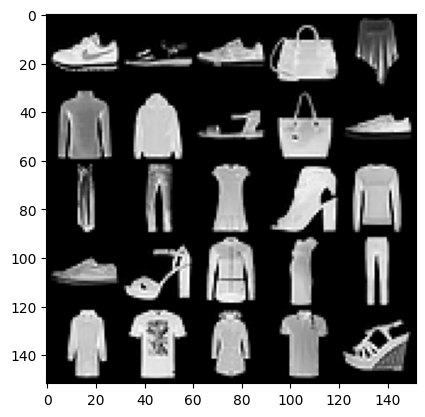

 26%|██▌       | 121/469 [00:02<00:08, 40.91it/s]

Step 2000 -> GEN Loss : 1.4577505345344555, DISC Loss : 1.5624706446528451


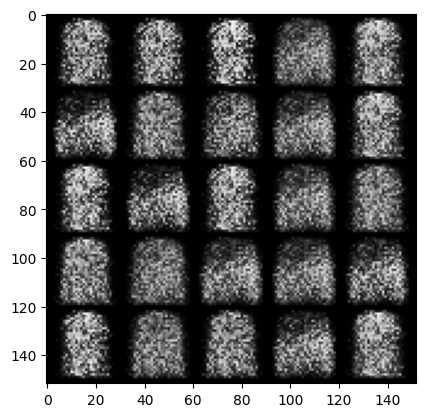

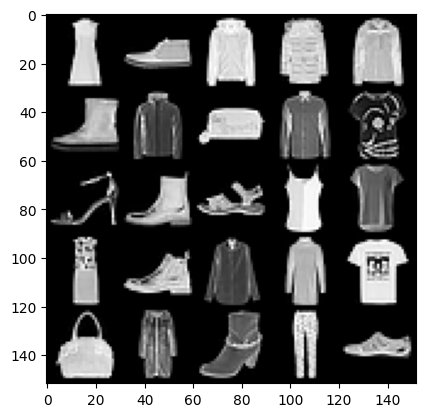

 33%|███▎      | 155/469 [00:03<00:06, 45.86it/s]

Step 2500 -> GEN Loss : 1.6779373891353602, DISC Loss : 1.891014030694962


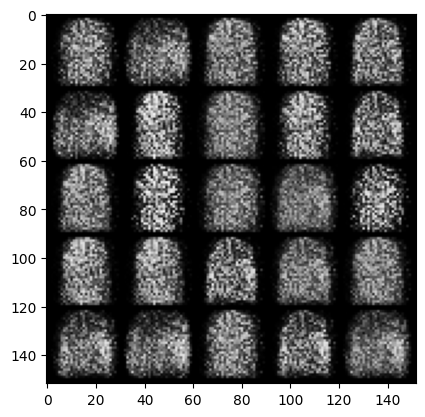

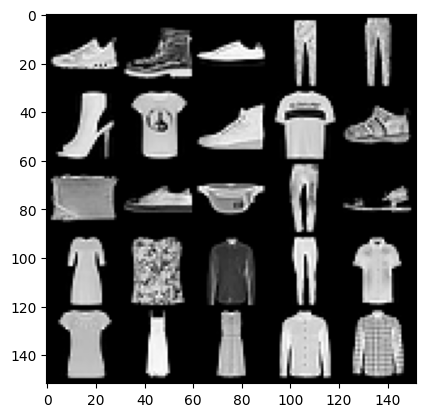

 39%|███▉      | 184/469 [00:04<00:06, 45.34it/s]

Step 3000 -> GEN Loss : 1.9219189996719375, DISC Loss : 2.206891967862846


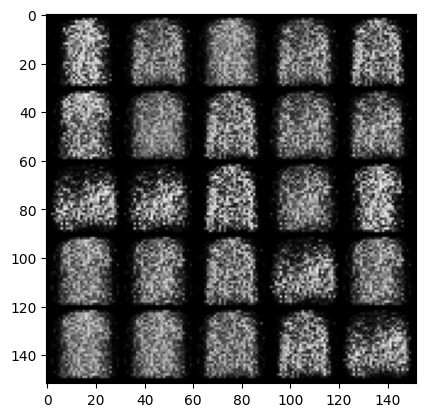

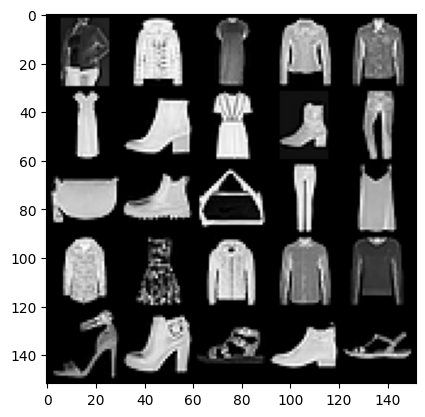

 46%|████▌     | 214/469 [00:04<00:05, 46.45it/s]

Step 3500 -> GEN Loss : 1.9769336209297208, DISC Loss : 2.5274614811539626


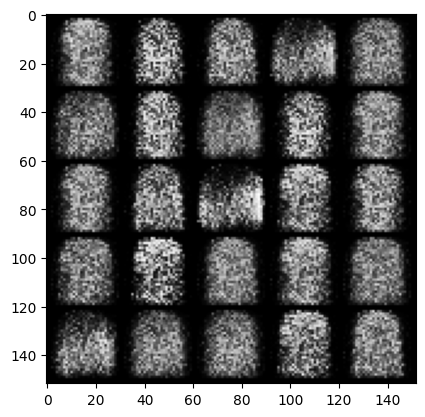

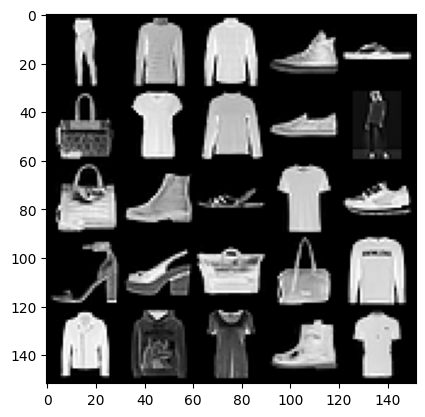

 52%|█████▏    | 244/469 [00:05<00:04, 45.74it/s]

Step 4000 -> GEN Loss : 1.8822568185329434, DISC Loss : 2.8723076690435394


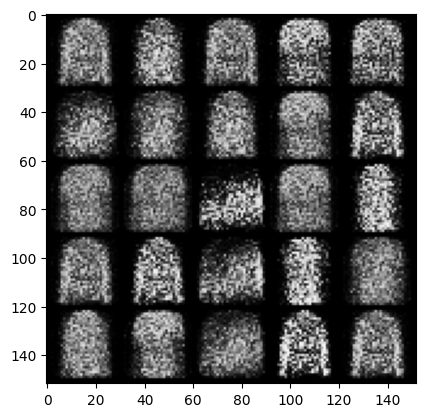

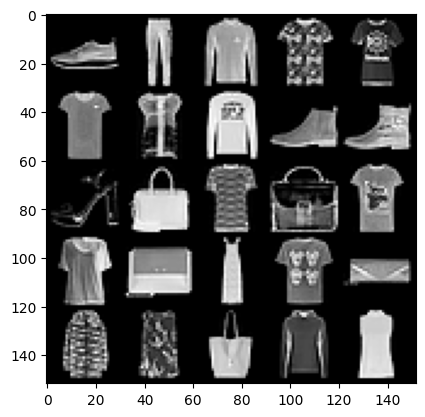

 59%|█████▉    | 279/469 [00:06<00:04, 44.56it/s]

Step 4500 -> GEN Loss : 1.8603328893184656, DISC Loss : 3.2077231665253656


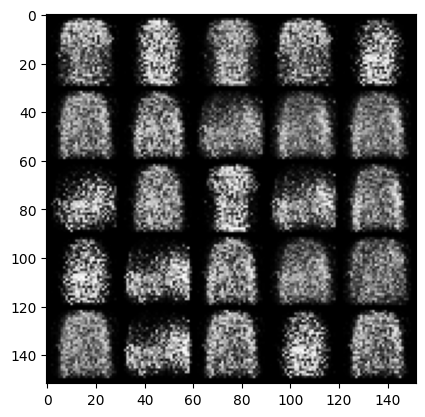

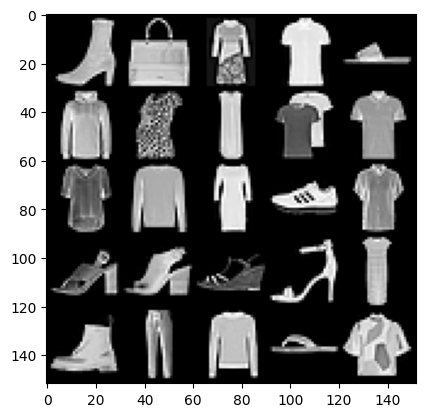

 66%|██████▌   | 309/469 [00:07<00:03, 43.12it/s]

Step 5000 -> GEN Loss : 1.8828853440284739, DISC Loss : 3.5342437736988086


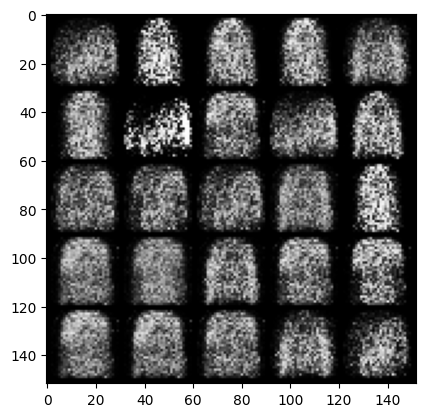

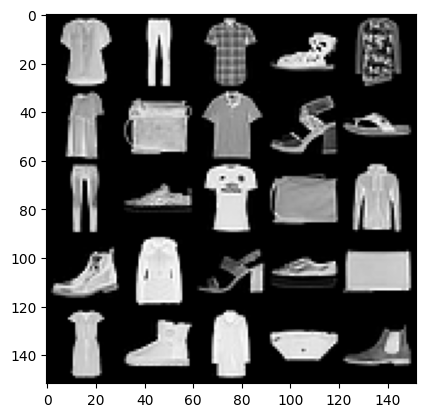

 72%|███████▏  | 338/469 [00:07<00:02, 43.77it/s]

Step 5500 -> GEN Loss : 1.922240474939347, DISC Loss : 3.852402402132748


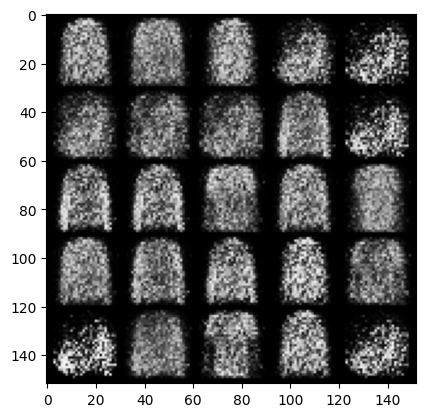

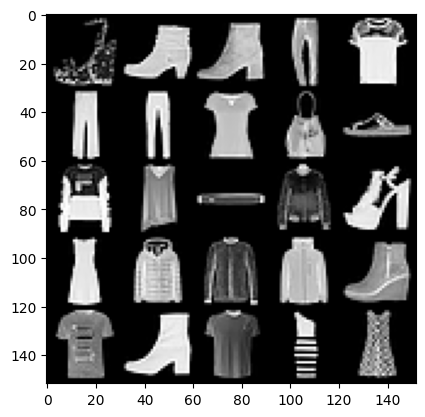

 79%|███████▊  | 369/469 [00:08<00:02, 43.17it/s]

Step 6000 -> GEN Loss : 1.8389808857440944, DISC Loss : 4.180098811417821


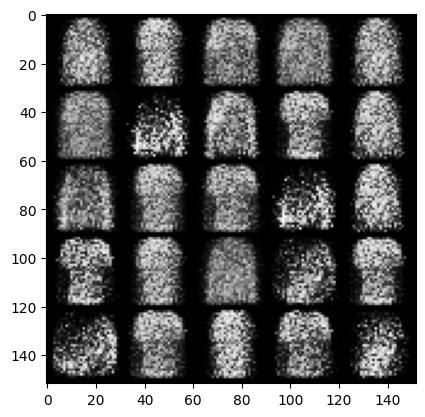

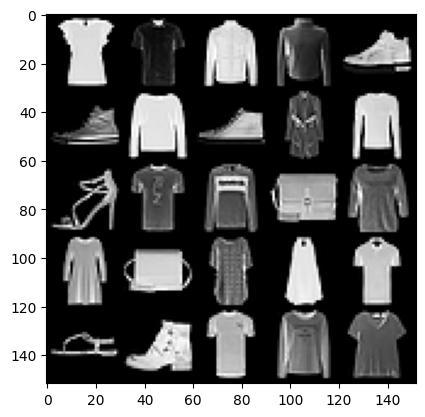

 86%|████████▌ | 401/469 [00:09<00:01, 43.36it/s]

Step 6500 -> GEN Loss : 1.8252772898674012, DISC Loss : 4.508985125571493


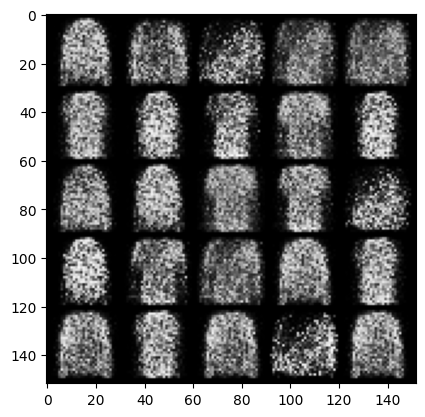

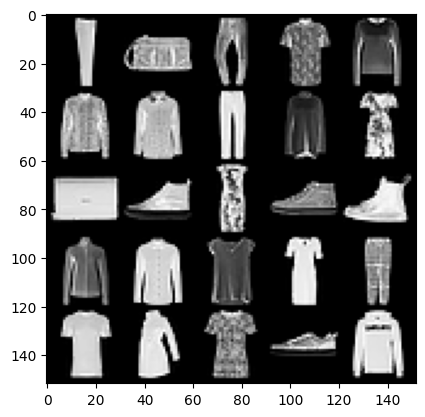

 92%|█████████▏| 433/469 [00:11<00:00, 43.04it/s]

Step 7000 -> GEN Loss : 1.834350364923477, DISC Loss : 4.830210860371592


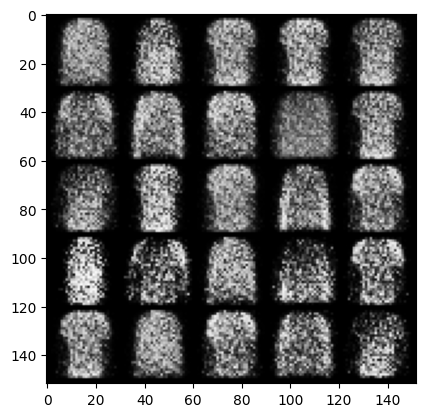

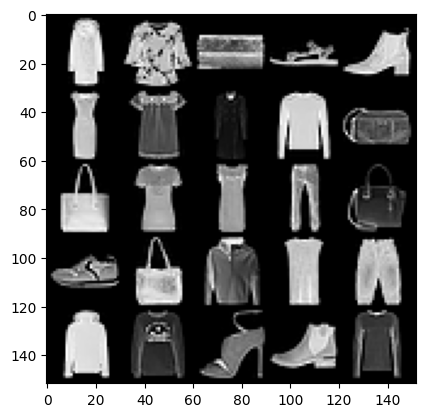

 99%|█████████▉| 465/469 [00:12<00:00, 41.53it/s]

Step 7500 -> GEN Loss : 1.862058530330658, DISC Loss : 5.166858267307282


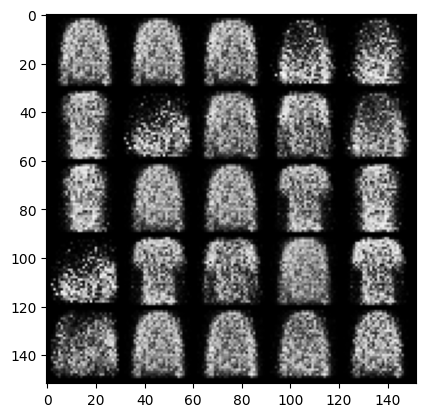

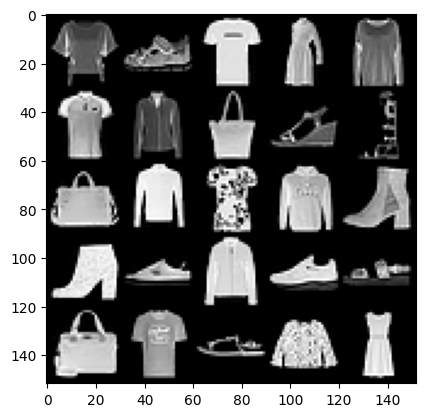

  5%|▌         | 24/469 [00:00<00:12, 36.79it/s]

Step 8000 -> GEN Loss : 1.8510694413185125, DISC Loss : 5.496555990725743


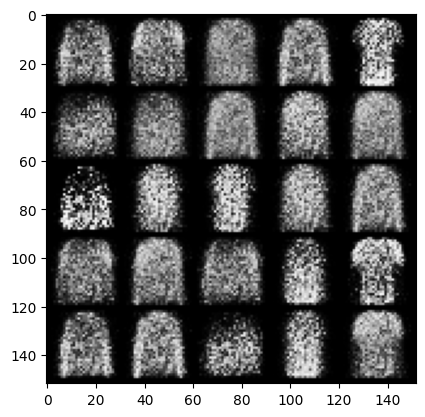

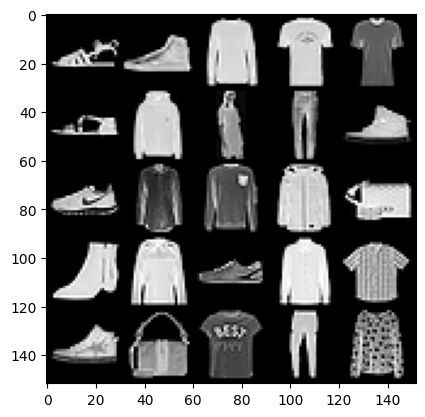

 12%|█▏        | 56/469 [00:01<00:09, 42.60it/s]

Step 8500 -> GEN Loss : 1.6538710854053496, DISC Loss : 5.863778096288428


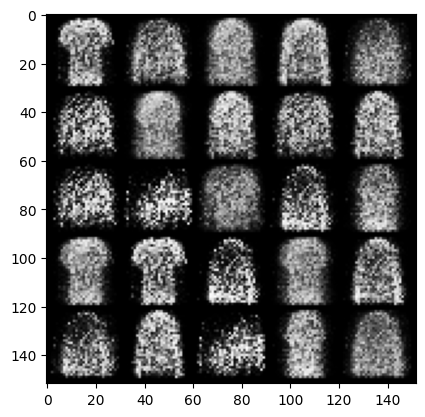

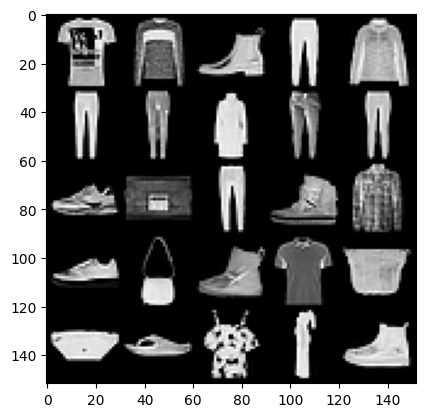

 19%|█▉        | 88/469 [00:02<00:09, 40.77it/s]

Step 9000 -> GEN Loss : 1.7619222309589377, DISC Loss : 6.217057057887303


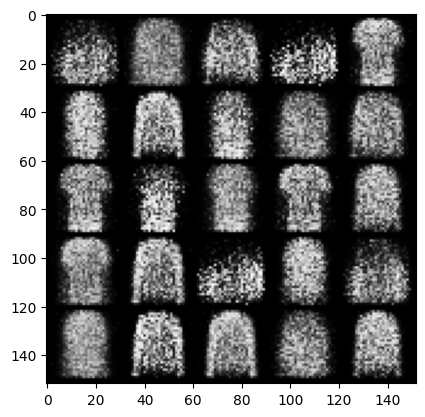

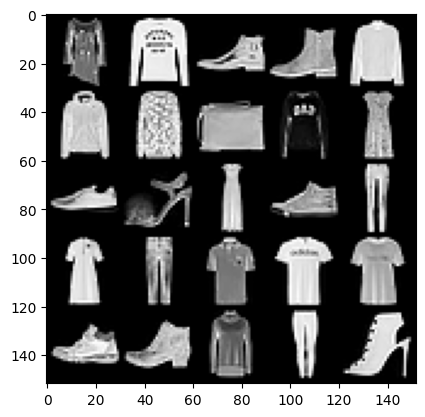

 25%|██▌       | 119/469 [00:03<00:08, 41.85it/s]

Step 9500 -> GEN Loss : 1.7277630364894883, DISC Loss : 6.564076475292436


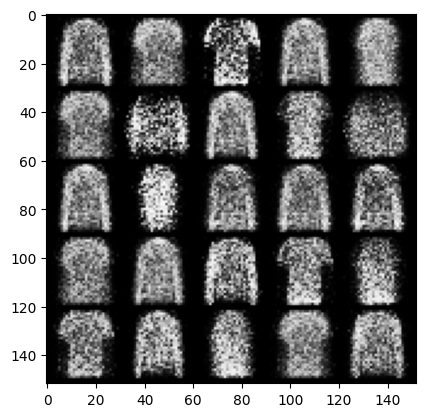

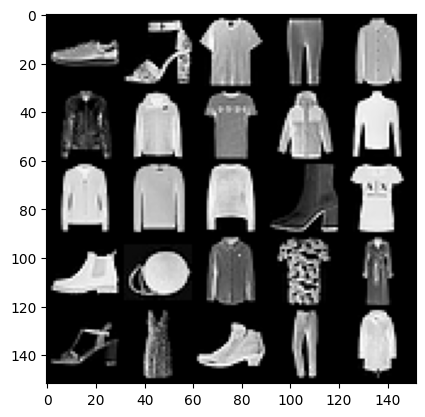

 32%|███▏      | 149/469 [00:03<00:07, 42.16it/s]

Step 10000 -> GEN Loss : 1.6412182309627537, DISC Loss : 6.930250814110037


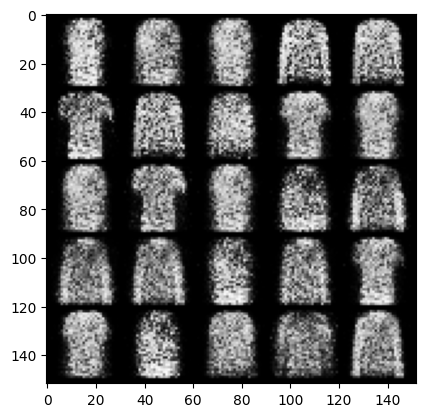

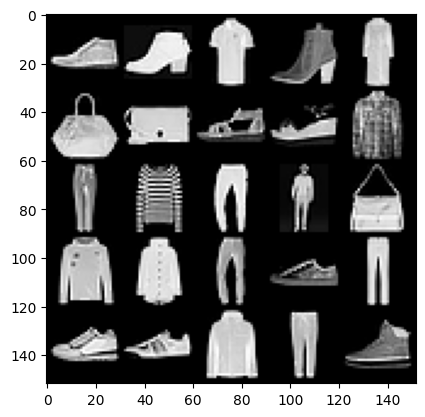

 39%|███▉      | 182/469 [00:04<00:08, 33.76it/s]

Step 10500 -> GEN Loss : 1.6964325463771819, DISC Loss : 7.284610886543986


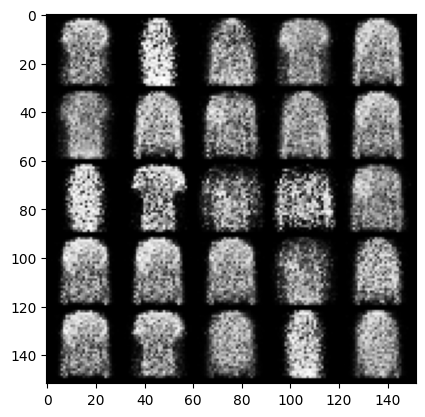

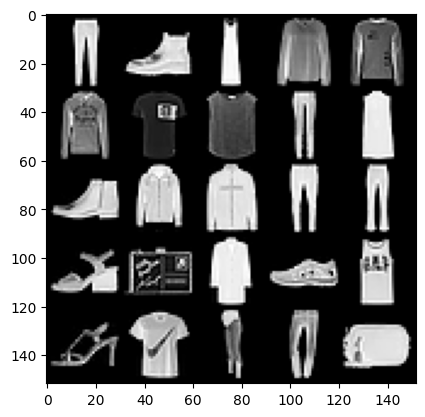

 45%|████▌     | 212/469 [00:05<00:08, 29.83it/s]

Step 11000 -> GEN Loss : 1.579301330566406, DISC Loss : 7.664571067661048


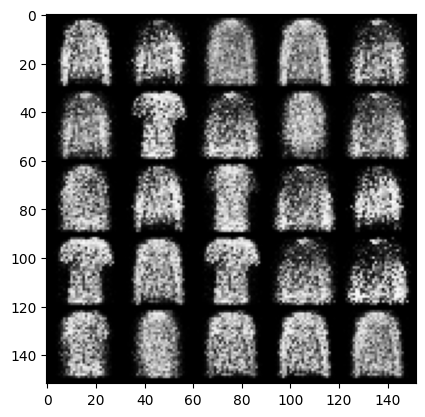

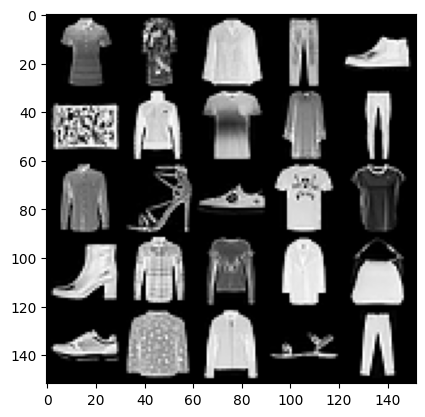

 52%|█████▏    | 244/469 [00:07<00:07, 29.28it/s]

Step 11500 -> GEN Loss : 1.5524144611358621, DISC Loss : 8.049456550925985


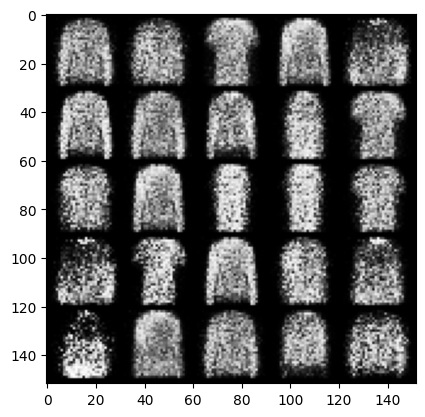

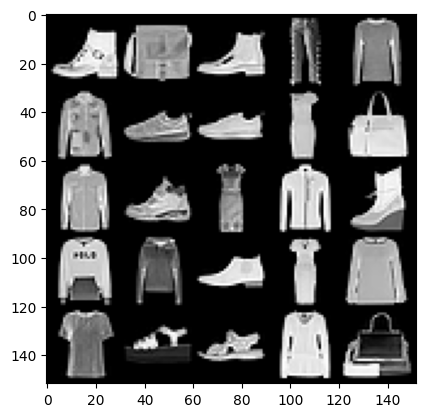

 58%|█████▊    | 273/469 [00:07<00:05, 32.78it/s]

Step 12000 -> GEN Loss : 1.6141178524494173, DISC Loss : 8.412317664891512


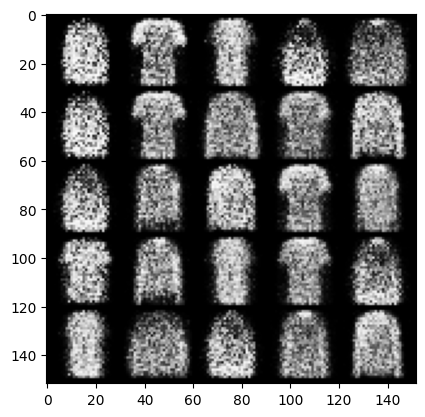

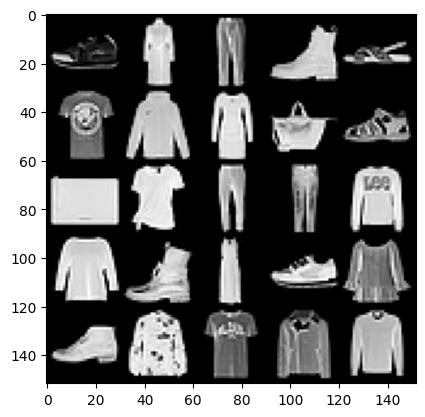

 65%|██████▌   | 305/469 [00:08<00:05, 32.29it/s]

Step 12500 -> GEN Loss : 1.6071469042301176, DISC Loss : 8.786510220021052


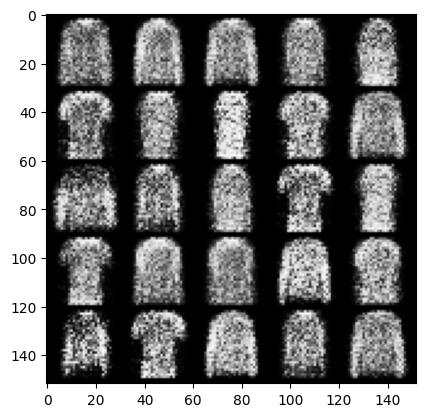

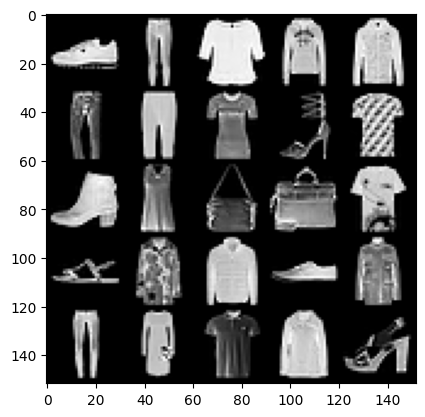

 72%|███████▏  | 336/469 [00:09<00:04, 33.04it/s]

Step 13000 -> GEN Loss : 1.5410896763801554, DISC Loss : 9.158507467597767


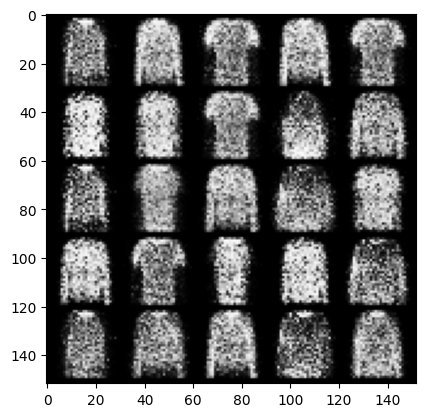

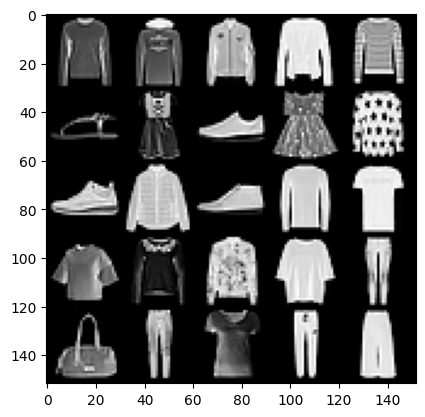

 78%|███████▊  | 366/469 [00:10<00:02, 37.23it/s]

Step 13500 -> GEN Loss : 1.5060033307075515, DISC Loss : 9.546585258156087


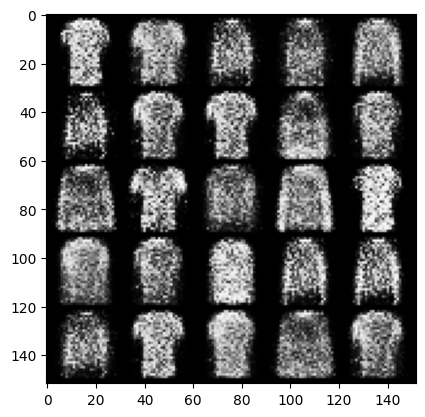

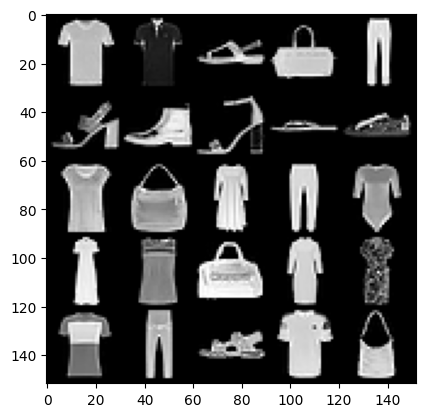

 85%|████████▌ | 399/469 [00:11<00:01, 36.77it/s]

Step 14000 -> GEN Loss : 1.5315916924476591, DISC Loss : 9.920732256561545


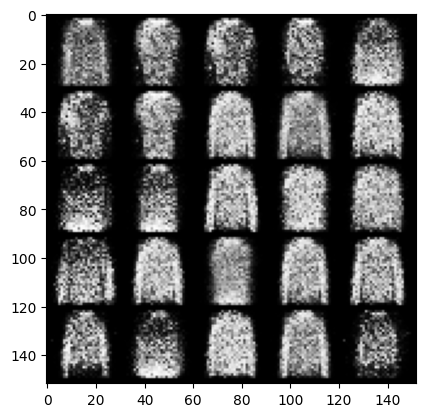

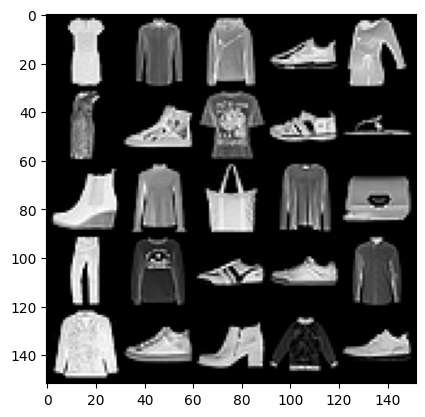

 92%|█████████▏| 430/469 [00:12<00:01, 36.62it/s]

Step 14500 -> GEN Loss : 1.5042262904644017, DISC Loss : 10.299203844040676


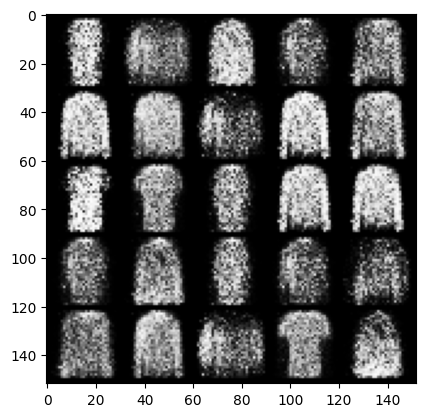

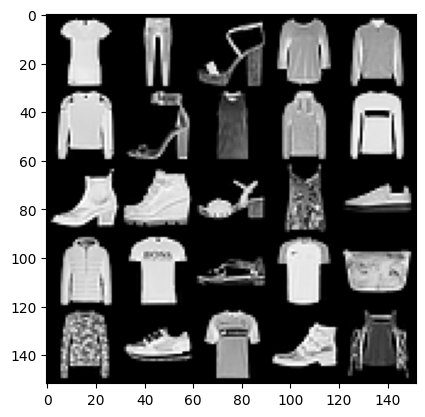

 98%|█████████▊| 458/469 [00:13<00:00, 37.08it/s]

Step 15000 -> GEN Loss : 1.4638694689273832, DISC Loss : 10.698511998504454


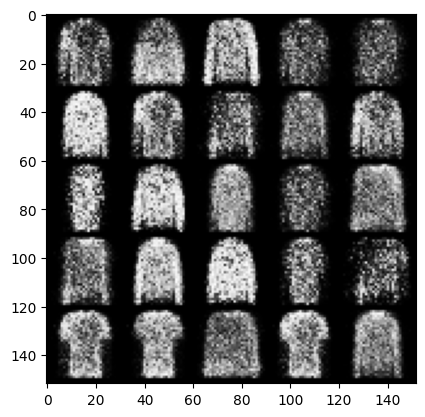

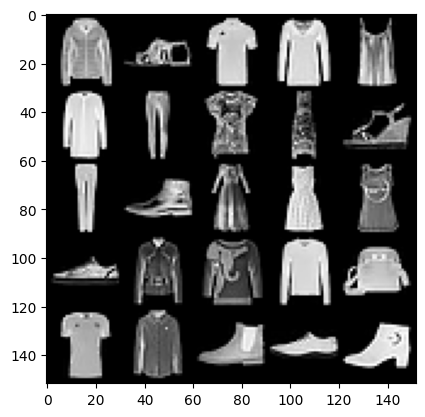

  4%|▍         | 20/469 [00:00<00:11, 38.32it/s]

Step 15500 -> GEN Loss : 1.365449325561523, DISC Loss : 11.123332005828667


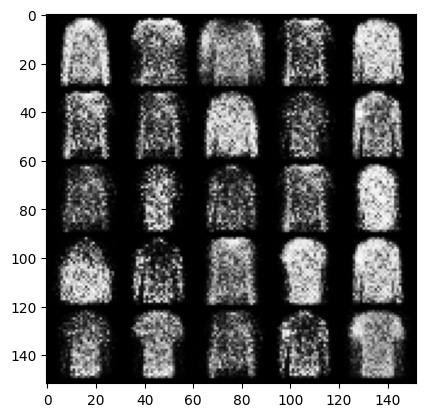

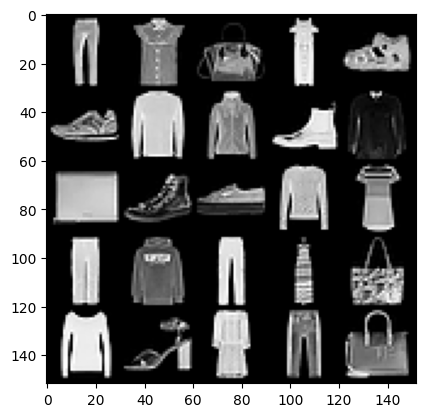

 11%|█         | 52/469 [00:01<00:10, 38.30it/s]

Step 16000 -> GEN Loss : 1.3396899392604842, DISC Loss : 11.546350266844078


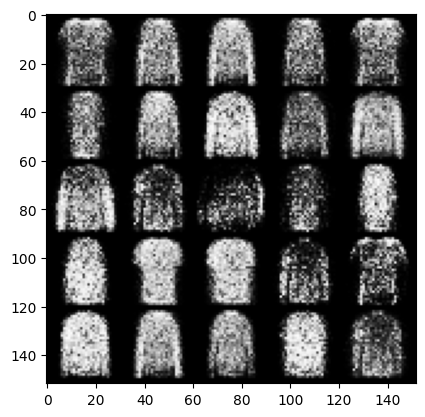

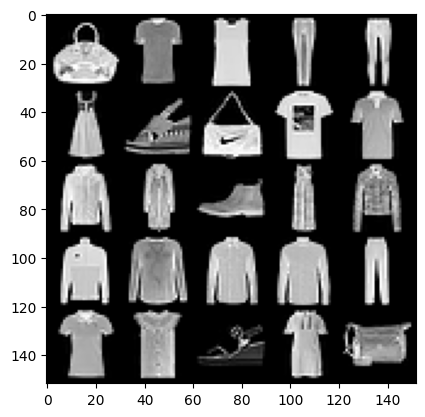

 18%|█▊        | 84/469 [00:02<00:10, 37.19it/s]

Step 16500 -> GEN Loss : 1.2774044048786157, DISC Loss : 11.986524608820742


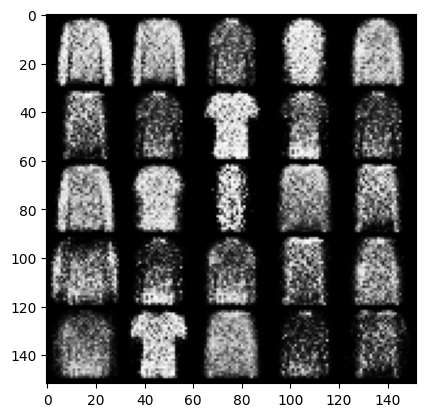

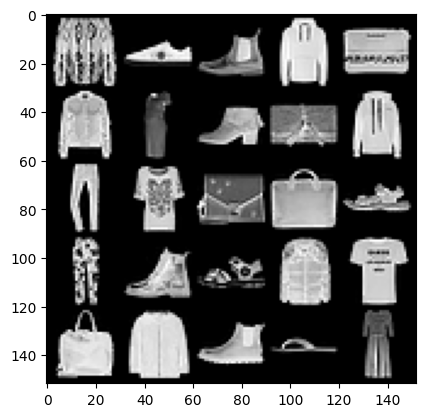

 25%|██▍       | 116/469 [00:03<00:09, 37.11it/s]

Step 17000 -> GEN Loss : 1.2887843279838556, DISC Loss : 12.417766663998437


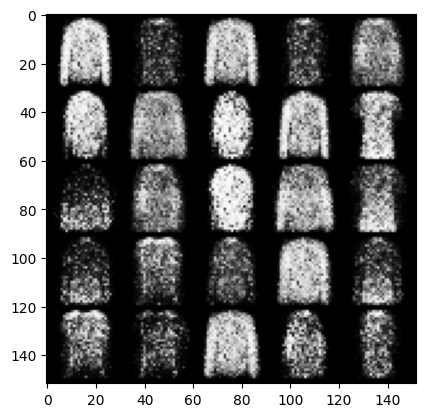

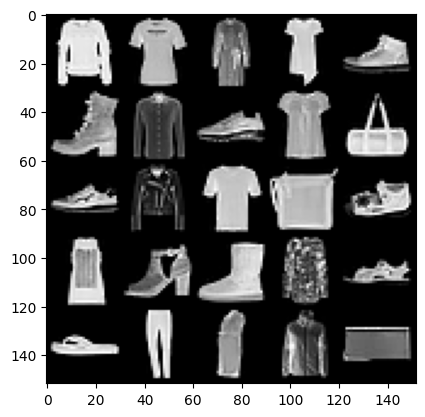

 31%|███       | 144/469 [00:03<00:08, 36.24it/s]

Step 17500 -> GEN Loss : 1.2546139693260188, DISC Loss : 12.858656481891945


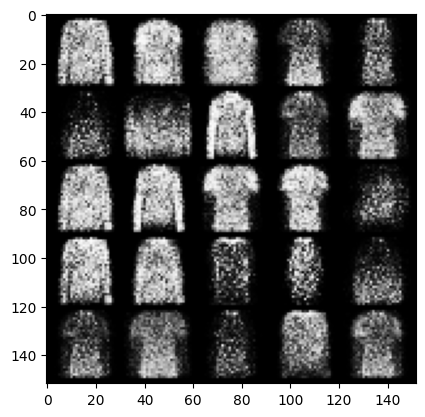

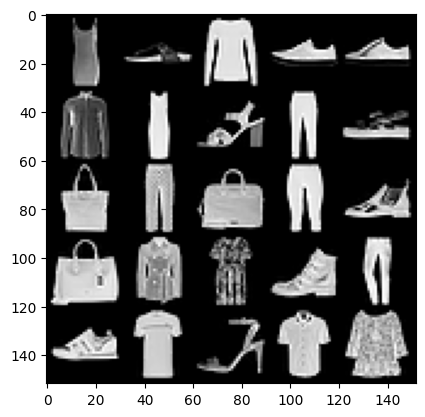

 38%|███▊      | 176/469 [00:04<00:09, 29.55it/s]

Step 18000 -> GEN Loss : 1.18770331120491, DISC Loss : 13.322174771398391


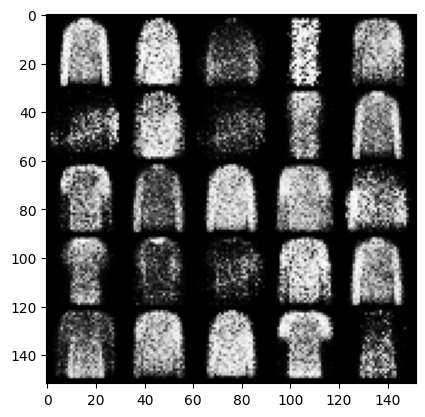

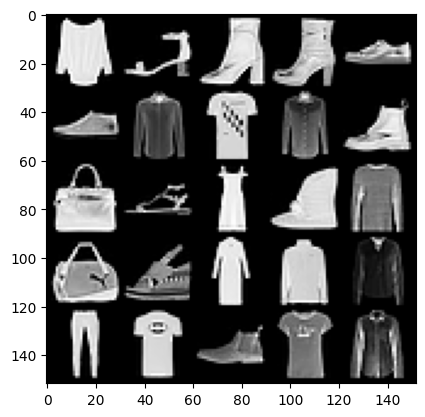

 44%|████▍     | 208/469 [00:05<00:07, 33.35it/s]

Step 18500 -> GEN Loss : 1.1497363542318337, DISC Loss : 13.800323664277887


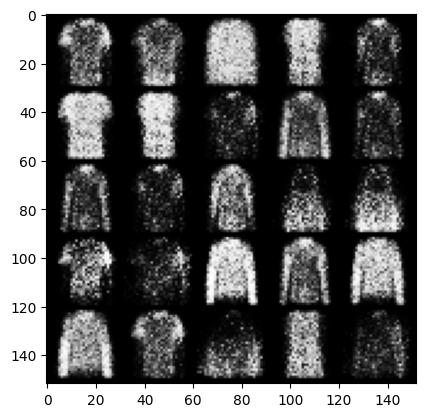

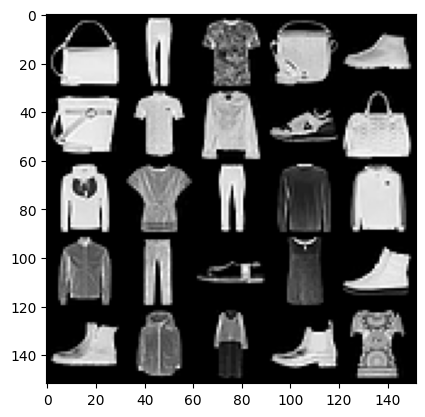

 51%|█████     | 240/469 [00:06<00:07, 32.11it/s]

Step 19000 -> GEN Loss : 1.1281938302516938, DISC Loss : 14.285783162444922


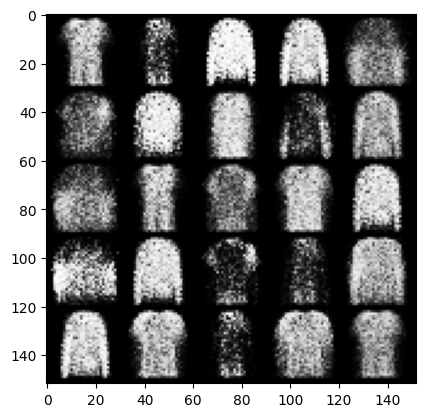

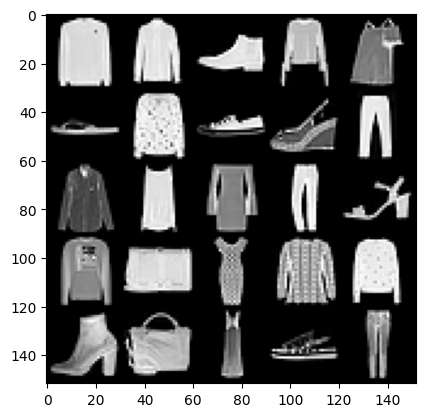

 58%|█████▊    | 271/469 [00:08<00:06, 30.29it/s]

Step 19500 -> GEN Loss : 1.1106339662075044, DISC Loss : 14.80538310423502


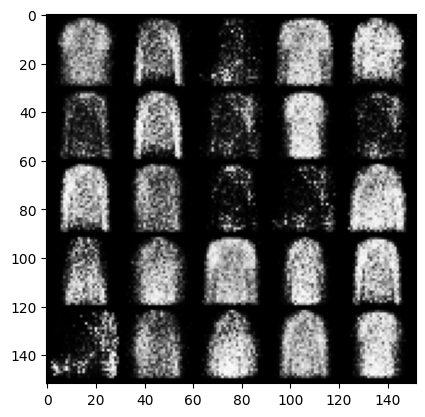

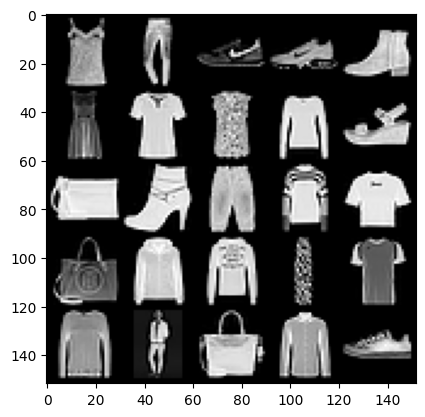

 64%|██████▍   | 300/469 [00:08<00:04, 35.72it/s]

Step 20000 -> GEN Loss : 1.048718242287636, DISC Loss : 15.337122402757478


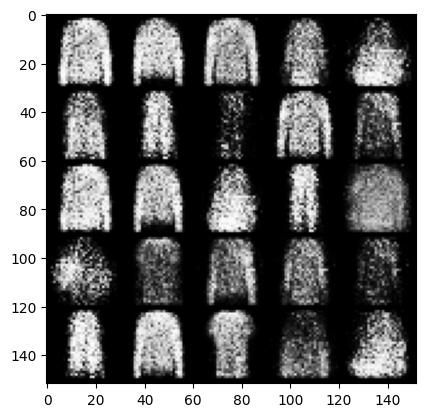

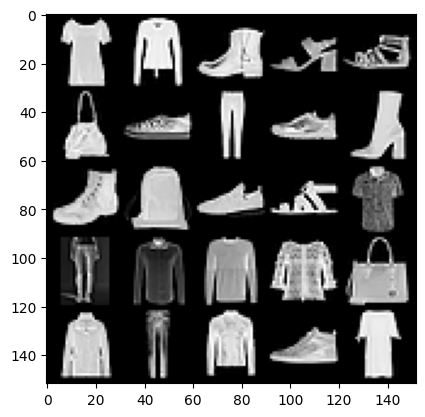

 71%|███████   | 332/469 [00:09<00:03, 36.29it/s]

Step 20500 -> GEN Loss : 1.0143155004978184, DISC Loss : 15.877913576394393


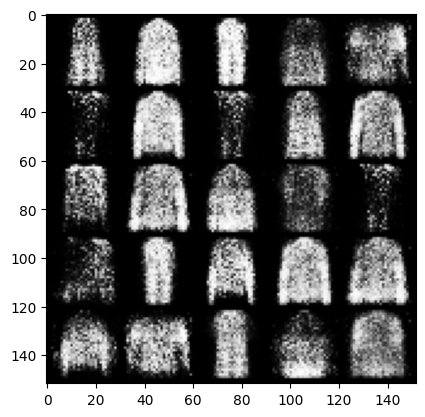

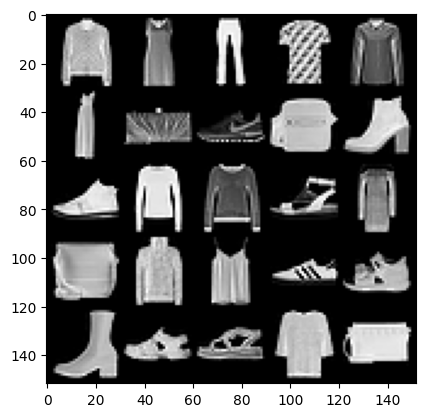

 65%|██████▌   | 305/469 [00:08<00:04, 34.72it/s]


KeyboardInterrupt: ignored

In [80]:
from tqdm import tqdm

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
# gen_loss = False

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    e_batch_size = len(real)

    real = real.view(e_batch_size, -1).to(device)

    disc_opt.zero_grad()
    d_loss = disc_loss(discriminator, generator, criterion, real, e_batch_size, noise_dim, device)
    d_loss.backward(retain_graph=True)

    disc_opt.step()


    gen_opt.zero_grad()
    g_loss = gen_loss(discriminator, generator, criterion, e_batch_size, noise_dim, device)
    g_loss.backward()
    gen_opt.step()

    mean_discriminator_loss += d_loss.item()/disp
    mean_generator_loss += g_loss.item() / disp

    if cur_step%disp==0 and cur_step > 0:
      print(f"Step {cur_step} -> GEN Loss : {mean_generator_loss}, DISC Loss : {mean_discriminator_loss}")
      fake_noise = create_noise(e_batch_size, noise_dim, device=device)
      fake = generator(fake_noise)
      show_images(fake)
      show_images(real)
      mean_generator_loss=0
      mean_discriminator_losss=0
    cur_step+=1


In [ ]:
# temp = iter(dataloader)
# len(next(temp)[0])

In [83]:
torch.save(generator, "generator")

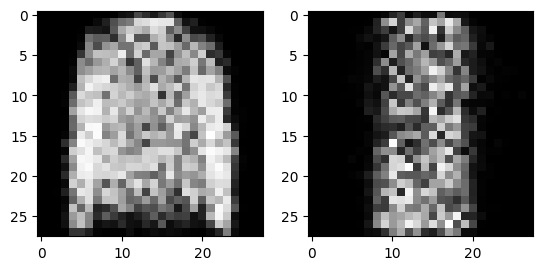

In [99]:
fn = create_noise(2, 64, device)
gfn = generator(fn).detach().cpu().view(2, 28, 28)

fig, axs = plt.subplots(1, 2)
axs[0].imshow(gfn[0], cmap="gray")
axs[1].imshow(gfn[1], cmap="gray")
# plt.imshow(gfn[0], cmap="gray")

In [102]:
from google.colab import files


torch.save(discriminator, "discriminator")
torch.save(gen_opt, "gen_opt")
torch.save(disc_opt, "disc_opt")

# files.download("discriminator")
files.download("gen_opt")
files.download("disc_opt")
# files.download("generator")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>